In [1]:
from pathlib import Path

from pkg.plot import stripplot, stripplot_cov
from scipy.spatial.distance import squareform

In [2]:
parcellations = [
    "AAL",
    "CPAC200",
    "DKT",
    "Desikan",
    "Glasser",
    "Yeo-17-liberal",
    "Yeo-17",
    "Yeo-7-liberal",
    "Yeo-7",
    "Schaefer200",
    "Schaefer300",
    "Schaefer400",
    "Schaefer1000",
]

In [3]:
all_subjects_df = pd.read_csv("../restricted_data/690subjects.csv")

male_idx = all_subjects_df.Gender == "M"
female_idx = all_subjects_df.Gender == "F"

In [4]:
data_path = Path("../results/")
genomes = np.load(data_path / "genome_distance.npz")["genome"]

genders = ["all", "F", "M"]

In [9]:
jdx

array([    0,     1,     2, ..., 43240, 43241, 43242])

In [10]:
t.mean()

0.031291650429214765

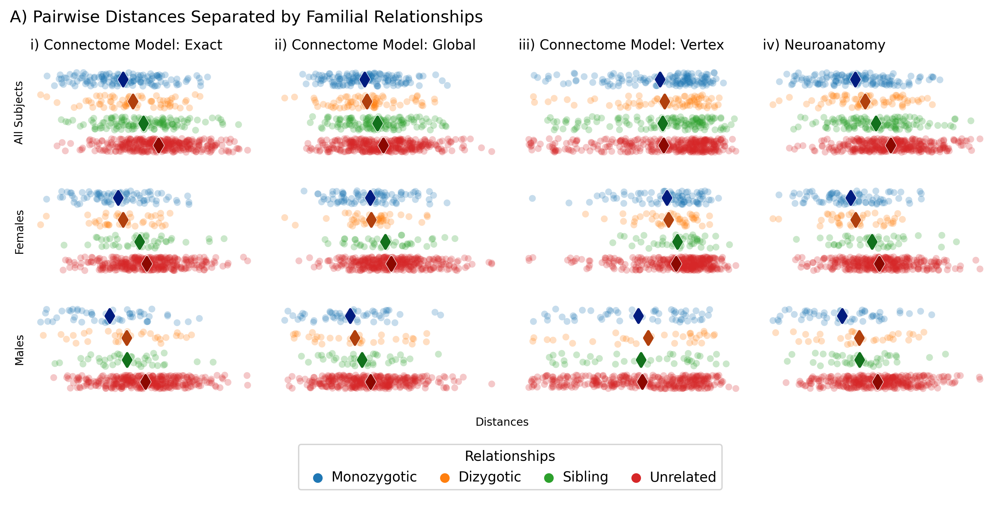

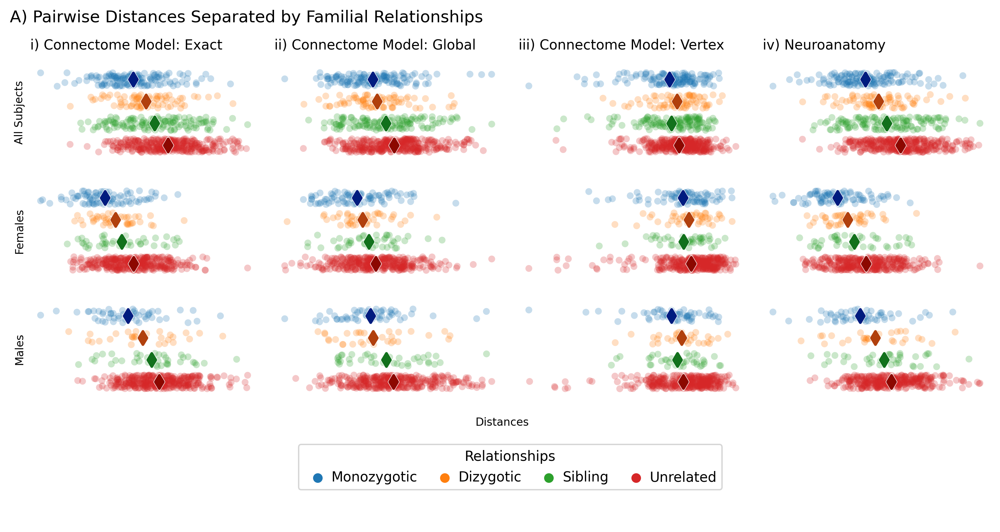

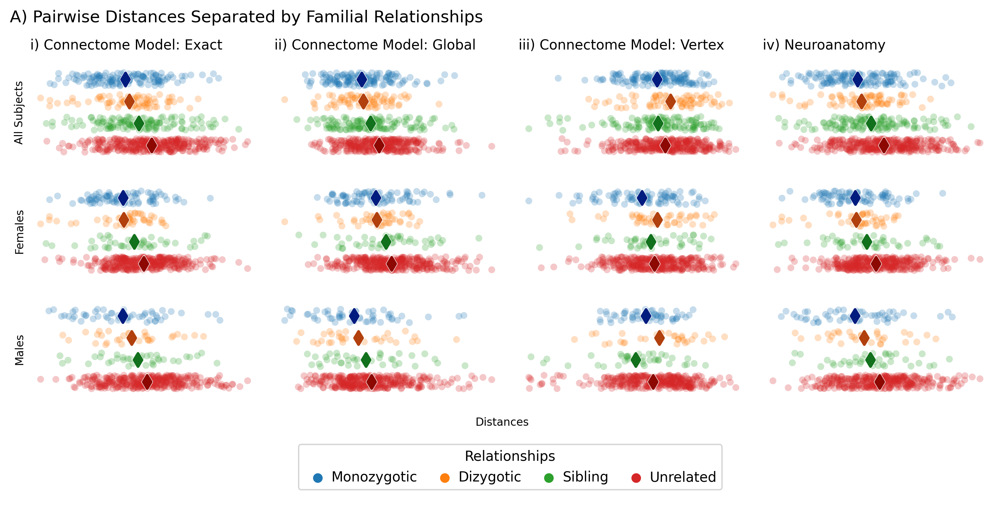

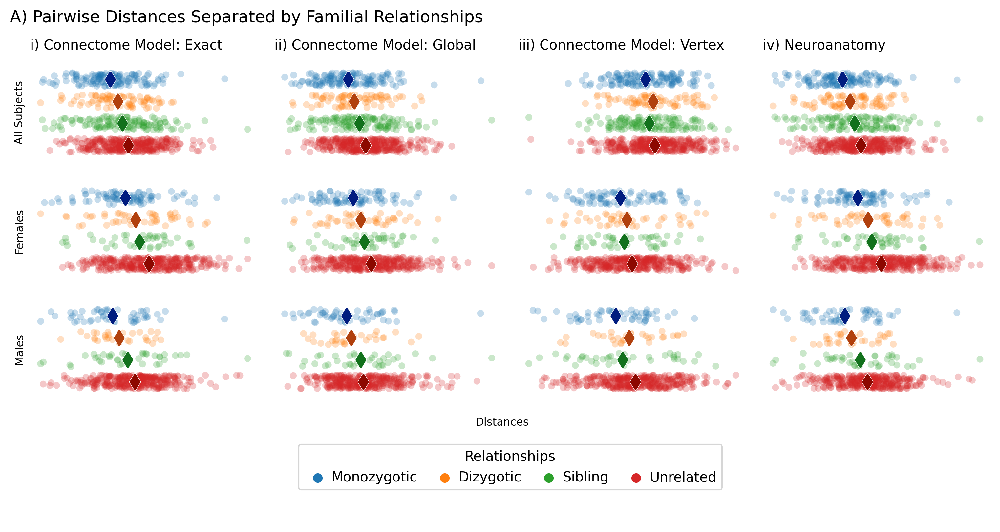

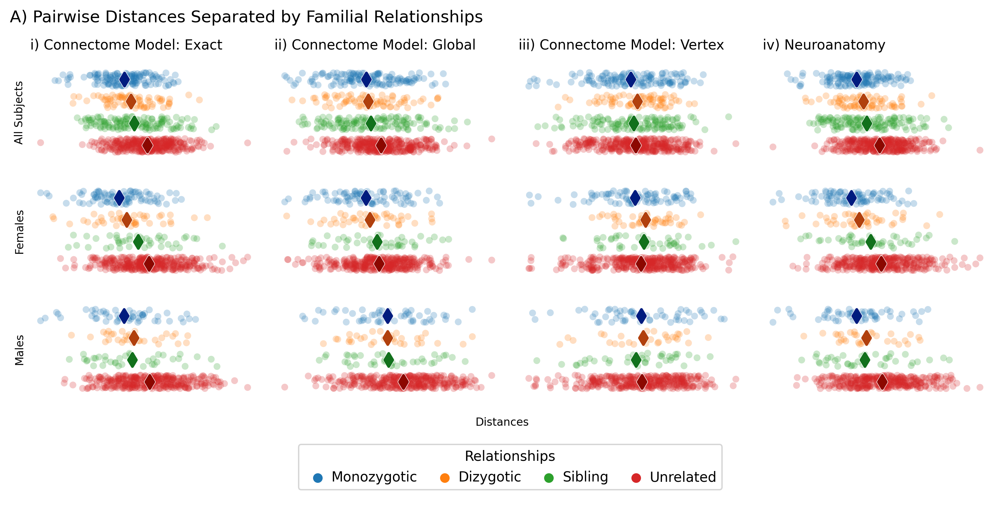

...

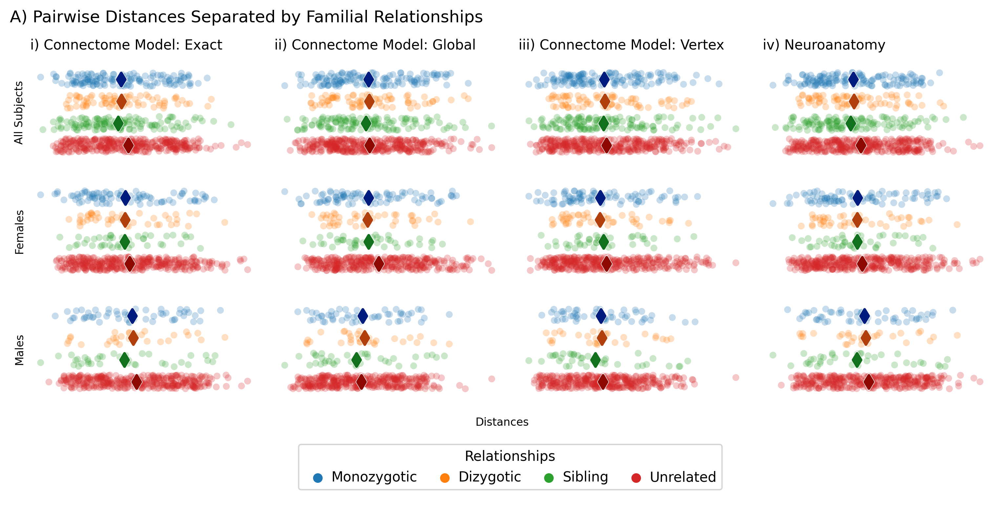

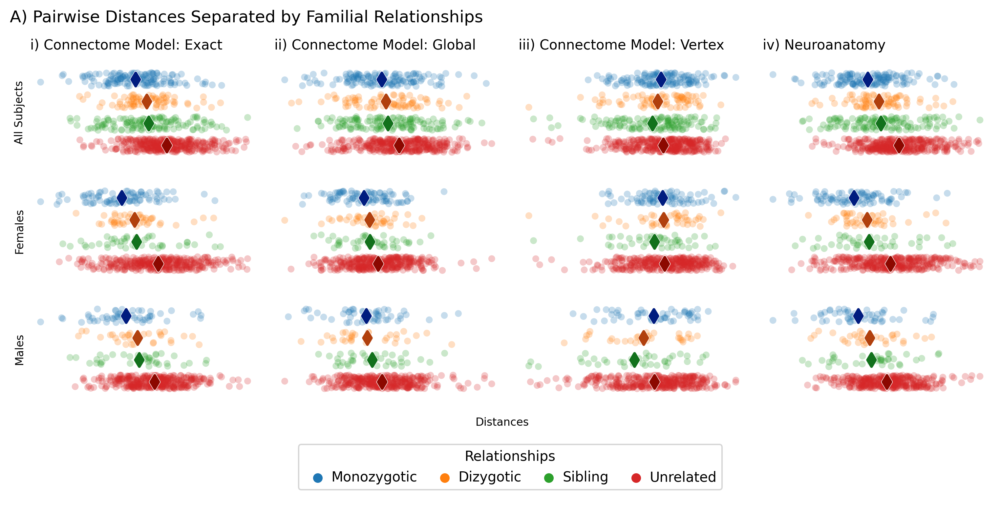

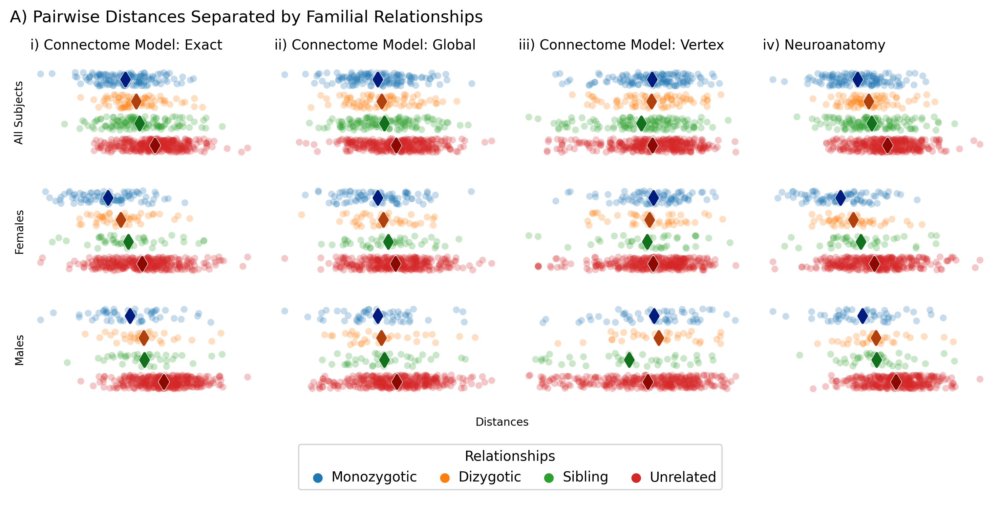

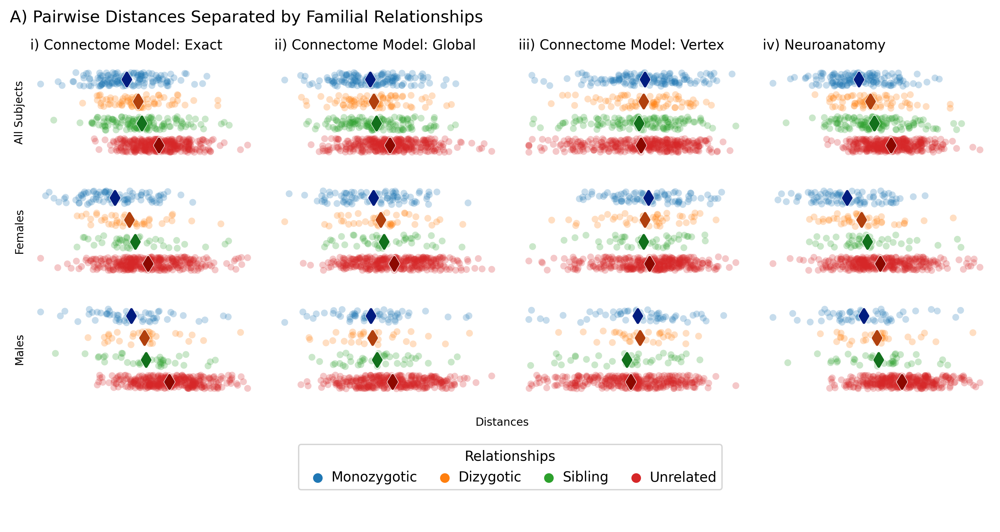

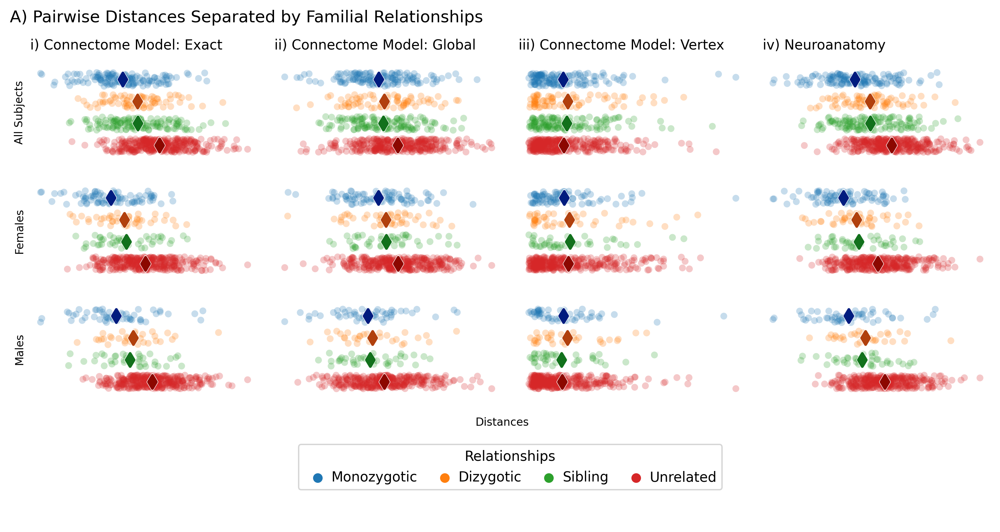

In [11]:
for parcellation in parcellations:
    distances = []

    models = ["exact", "glob", "vertex"]

    parc_path = data_path / parcellation
    connectome_distances = np.load(parc_path / "connectome_distances.npz")
    neuro_distance = np.load(parc_path / "covariate_distance.npz")["neuroanatomy"]

    for model in models:
        cdist = squareform(connectome_distances[model])
        gdist = squareform(genomes)
        ndist = squareform(neuro_distance)
        for gender in genders:
            if gender == "M":
                X = squareform(cdist[male_idx, :][:, male_idx])
                Y = squareform(gdist[male_idx, :][:, male_idx])
                Z = squareform(ndist[male_idx, :][:, male_idx])
            elif gender == "F":
                X = squareform(cdist[female_idx, :][:, female_idx])
                Y = squareform(gdist[female_idx, :][:, female_idx])
                Z = squareform(ndist[female_idx, :][:, female_idx])
            else:
                X = squareform(cdist)
                Y = squareform(gdist)
                Z = squareform(ndist)

            for i, rel in [(0, "MZ"), (1, "DZ"), (2, "NonTwin"), (4, "Unrelated")]:
                if i == 4:
                    t = X[np.where(Y == 4)[0]]
                    jdx = np.where(t > t.mean() - t.std())[0]
                    idx = np.random.choice(jdx, 350, replace=False)
                else:
                    idx = Y == i
                for j, q in zip(X[idx], Z[idx]):
                    distances.append([j, q, rel, model, gender])

    plot_df = pd.DataFrame(
        distances, columns=["distance", "covariate", "relationship", "scale", "gender"]
    )

    plot_df.gender.replace(
        to_replace=dict(All="all", F="female", M="male"), inplace=True
    )

    gender = ["all", "female", "male"]
    scale = ["exact", "global", "vertex"]
    layout = [
        ["exact-all", "global-all", "vertex-all", "covariate-all"],
        ["exact-female", "global-female", "vertex-female", "covariate-female"],
        ["exact-male", "global-male", "vertex-male", "covariate-male"],
        ["legend", "legend", "legend", "legend"],
    ]
    col_names = [
        "i) Connectome Model: Exact",
        "ii) Connectome Model: Global",
        "iii) Connectome Model: Vertex",
    ]

    fig, axes = plt.subplot_mosaic(
        layout,
        figsize=(10, 5),
        width_ratios=[1, 1, 1, 1],
        height_ratios=[1, 1, 1, 1],
        dpi=300,
        constrained_layout=True,
    )

    ax_arr = np.array([val for key, val in axes.items() if key != "legend"]).reshape(
        3, -1
    )
    handles, labels = stripplot(plot_df, ax_arr[:3, :3], col_names=col_names)
    stripplot_cov(plot_df, ax_arr[:3, -1])

    # handle limits
    limits = [[a.get_xlim() for a in b] for b in ax_arr]

    ax = axes["legend"]
    sns.despine(bottom=True, left=True, top=True, right=True, ax=ax)
    ax.legend(
        handles[:4],
        ["Monozygotic", "Dizygotic", "Sibling", "Unrelated"],
        loc=10,
        title="Relationships",
        ncol=4,
        handletextpad=0,
        columnspacing=1,
        frameon=True,
    )
    ax.axis("off")

    fig.suptitle(
        "A) Pairwise Distances Separated by Familial Relationships",
        x=0.0,
        y=1.05,
        horizontalalignment="left",
        fontsize=12,
    )
    fig.supxlabel("Distances", y=0.2, fontsize=8)

    fig.savefig(f"./figures/distances/{parcellation}.svg", bbox_inches="tight")